In [1]:
# TODO Change code completly to pathlib for crossfunctionality
from os import listdir, path
from PIL import Image
from pathlib import Path
from cv2 import imread, copyMakeBorder, imwrite, BORDER_CONSTANT
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import plotly.express as px

In [2]:
import plotly.graph_objects as go
fig = go.FigureWidget(data=go.Bar(y=[2, 3, 1]))
fig

FigureWidget({
    'data': [{'type': 'bar', 'uid': '19eb1f18-741d-4e54-8d0b-57f743c2102b', 'y': [2, 3, 1]}],
 …

In [3]:
train_path = '/Users/beantown/PycharmProjects/jigsaw-puzzle-solver/data/hisfrag20/raw/hisfrag20/'
test_path = '/Users/beantown/PycharmProjects/jigsaw-puzzle-solver/data/hisfrag20/raw/hisfrag20_test/'
train_result_path = '/Users/beantown/PycharmProjects/jigsaw-puzzle-solver/data/hisfrag20/prepared/resized/hisfrag20/'
test_result_path = '/Users/beantown/PycharmProjects/jigsaw-puzzle-solver/data/hisfrag20//prepared/resized/hisfrag20_test/'

In [4]:
def get_filenames(train_path, test_path):
    # load file names train dataset
    train = [path.splitext(f)[0] for f in listdir(train_path) if path.isfile(path.join(train_path, f))]

    # load file name test dataset
    test = [path.splitext(f)[0] for f in listdir(test_path) if path.isfile(path.join(test_path, f))]
    
    return train, test

In [5]:
def get_imgsize(train_filenames, test_filenames, train_path, test_path):
    train = [Image.open(train_path + f + '.jpg', 'r').size for f in train_filenames]
    test = [Image.open(test_path + f + '.jpg', 'r').size for f in test_filenames]
    return train, test

In [6]:
train_filenames, test_filenames = get_filenames(train_path, test_path)

In [7]:
train_size, test_size = get_imgsize(train_filenames, test_filenames, train_path, test_path)

In [8]:
train_size = np.array(train_size)
test_size = np.array(test_size)

In [9]:
train_size.shape

(101707, 2)

In [10]:
test_size.shape

(20019, 2)

In [11]:
train_df = pd.DataFrame(train_size, columns=['x','y'])
test_df = pd.DataFrame(test_size, columns=['x','y'])

In [14]:
train_df.shape

(101707, 2)

In [15]:
test_df.shape

(20019, 2)

In [12]:
train_df.head()

,x,y
0,177,139
1,80,203
2,763,1097
3,85,147
4,190,203


In [26]:
train_df.x.mean()

371.0949787133629

In [27]:
train_df.y.mean()

378.02092284700166

In [13]:
test_df.head()

,x,y
0,323,687
1,283,329
2,1895,2106
3,377,451
4,943,1329


In [20]:
df = pd.concat([test_df, train_df])

In [21]:
df.head()

,x,y
0,323,687
1,283,329
2,1895,2106
3,377,451
4,943,1329


In [22]:
df.shape

(121726, 2)

In [24]:
df.x.mean()

433.2582192793651

In [25]:
df.y.mean()

445.35493649672213

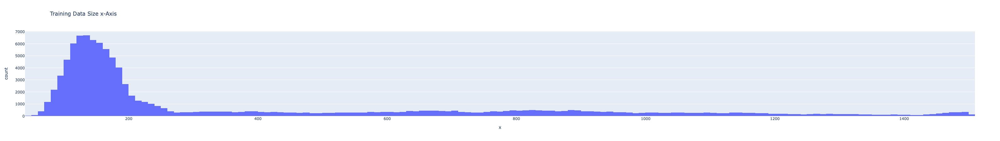

In [12]:
fig = px.histogram(train_df, x="x", title='Training Data Size x-Axis')
fig.show()

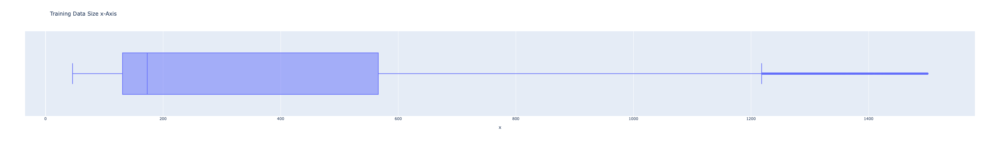

In [13]:
fig = px.box(train_df, x="x", title='Training Data Size x-Axis')
fig.show()

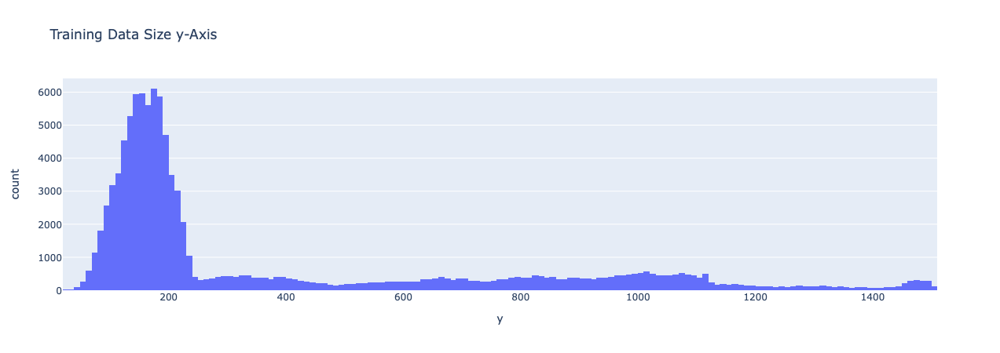

In [14]:
fig = px.histogram(train_df, x="y", title='Training Data Size y-Axis')
fig.show()

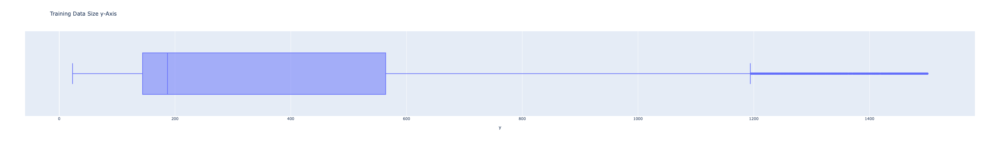

In [15]:
fig = px.box(train_df, x="y", title='Training Data Size y-Axis')
fig.show()

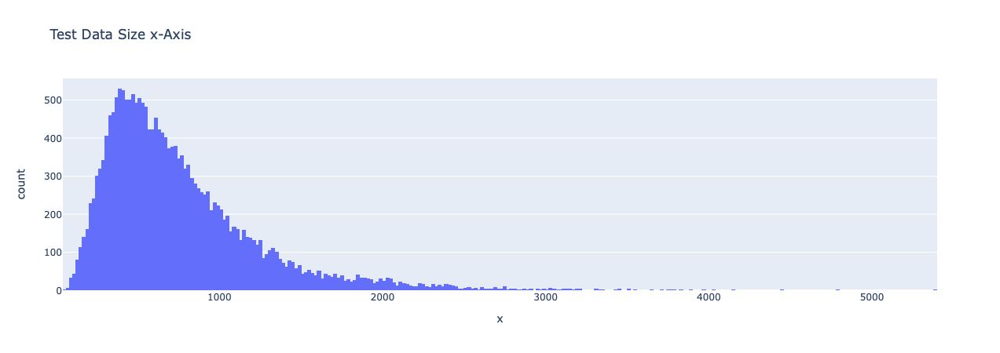

In [16]:
fig = px.histogram(test_df, x="x", title='Test Data Size x-Axis')
fig.show()

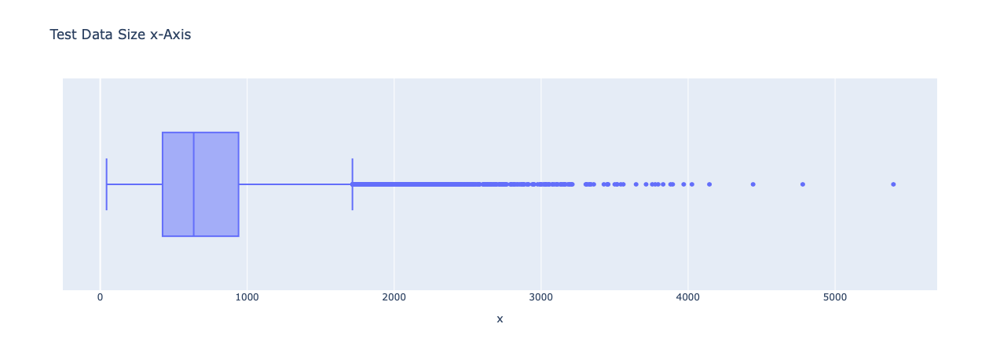

In [17]:
fig = px.box(test_df, x="x", title='Test Data Size x-Axis')
fig.show()

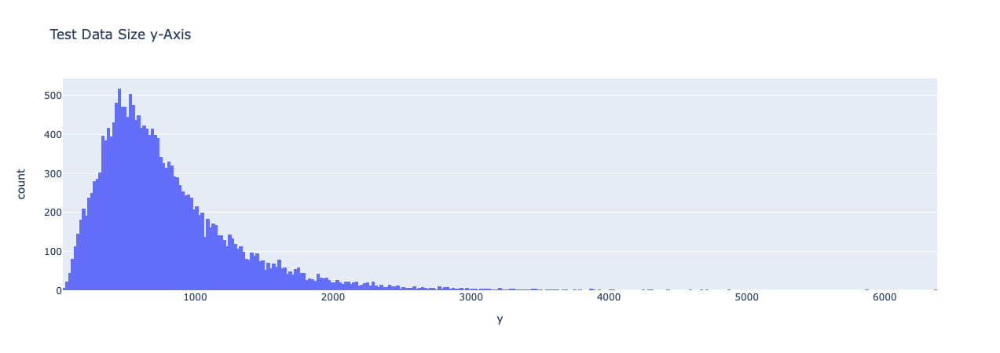

In [18]:
fig = px.histogram(test_df, x="y", title='Test Data Size y-Axis')
fig.show()

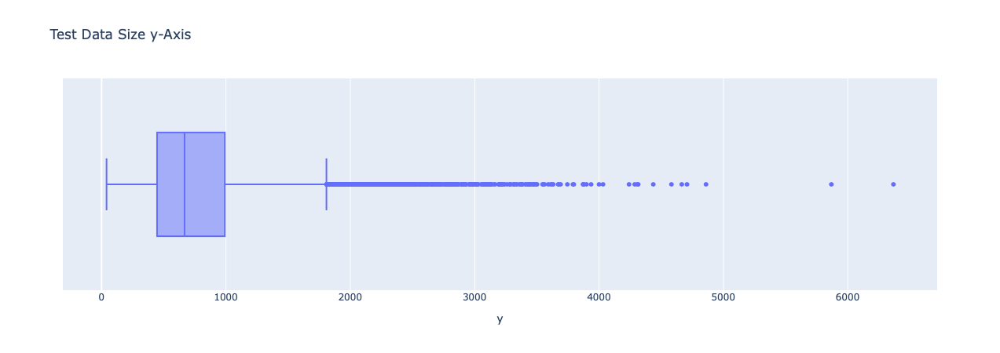

In [19]:
fig = px.box(test_df, x="y", title='Test Data Size y-Axis')
fig.show()

In [20]:
train_df['filenames'] = train_filenames
test_df['filenames'] = test_filenames

In [21]:
train_df.shape

(101707, 3)

In [22]:
test_df.shape

(20019, 3)

In [23]:
crop_train_df = train_df.copy()
crop_test_df = test_df.copy()

pad_train_df = train_df.copy()
pad_test_df = test_df.copy()

# Train

In [24]:
quantiles_values = [0.25, 0.75]
x_quantiles = train_df.x.quantile(quantiles_values)
y_quantiles = train_df.y.quantile(quantiles_values)

pad_train_df = pad_train_df[(pad_train_df.x >= x_quantiles[0.25]) & (pad_train_df.x <= x_quantiles[0.75])]
pad_train_df = pad_train_df[(pad_train_df.y >= y_quantiles[0.25]) & (pad_train_df.y <= y_quantiles[0.75])]

print(pad_train_df.shape)

crop_train_df = crop_train_df[(crop_train_df.x < x_quantiles[0.25]) | (crop_train_df.x > x_quantiles[0.75])]
crop_train_df = crop_train_df[(crop_train_df.y < y_quantiles[0.25]) | (crop_train_df.y > y_quantiles[0.75])]

print(crop_train_df.shape)

(32096, 3)
(31493, 3)


# Test

In [25]:
x_quantiles = test_df.x.quantile(quantiles_values)
y_quantiles = test_df.y.quantile(quantiles_values)

pad_test_df = pad_test_df[(pad_test_df.x >= x_quantiles[0.25]) & (pad_test_df.x <= x_quantiles[0.75])]
pad_test_df = pad_test_df[(pad_test_df.y >= y_quantiles[0.25]) & (pad_test_df.y <= y_quantiles[0.75])]

print(pad_test_df.shape)

crop_test_df = crop_test_df[(crop_test_df.x < x_quantiles[0.25]) | (crop_test_df.x > x_quantiles[0.75])]
crop_test_df = crop_test_df[(crop_test_df.y < y_quantiles[0.25]) | (crop_test_df.y > y_quantiles[0.75])]

print(crop_test_df.shape)

(6791, 3)
(6755, 3)


In [26]:
is_train_result_path_empty = not any(Path(train_result_path).iterdir())
is_test_result_path_empty = not any(Path(test_result_path).iterdir())

In [27]:
pad_train_df.head()

,x,y,filenames
4,190,203,8562_14999_5
6,183,168,8546_736_27
13,186,192,8539_3609_30
19,160,156,4842_17217_20
23,369,431,9482_753_1


In [28]:
pad_train_df.head()

,x,y,filenames
4,190,203,8562_14999_5
6,183,168,8546_736_27
13,186,192,8539_3609_30
19,160,156,4842_17217_20
23,369,431,9482_753_1


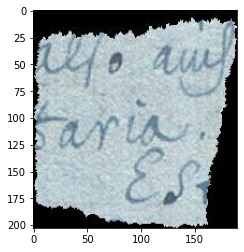

In [29]:
black = [0,0,0]

#to_crop_images = [imread(file) for file in crop_train_df.filenames]
to_pad_images = [imread(train_path + filename + '.jpg') for filename in pad_train_df.filenames]
plt.imshow(to_pad_images[0])

In [ ]:
top = int(x_quantiles[0.75])
bottom = int(x_quantiles[0.75])
left = int(y_quantiles[0.75])
right= int(y_quantiles[0.75])

print(top)
print(bottom)
print(left)
print(right)

paded_images = [copyMakeBorder(src=file, top=top, bottom=bottom, left=left, right=right, borderType=BORDER_CONSTANT,value=black) for file in to_pad_images]

for i, img in enumerate(paded_images):
    filename = pad_train_df.filenames.iloc[i]
    imwrite(train_result_path + filename + '.jpg', img)

941
941
991
991


In [127]:




#if is_train_result_path_empty:
        
    
    
    '''
    print(f'Train images not found in train_result_path.\nStart resizing and save results in: \n{train_result_path}\n')
    for filename in train_filenames:
        src = imread(train_path + filename + '.jpg')

        img = copyMakeBorder(src=src, top=test_size[0], bottom=test_size[0], left=test_size[1], right=test_size[1],borderType=BORDER_CONSTANT,value=black)
        imwrite(train_result_path + filename + '.jpg', img)
    '''
    


KeyboardInterrupt: 

In [110]:
else:
    print(f'Resized train images found in: \n{train_result_path}\nSkip resizing for train imgs\n')

if is_test_result_path_empty:

    print(f'Test images found in test_result_path.\nStart resizing and save results in: \n{test_result_path}\n')

    for filename in test_filenames:
        src = imread(test_path + filename + '.jpg')
        img = copyMakeBorder(src=src, top=test_size[0], bottom=test_size[0], left=test_size[1], right=test_size[1],borderType=BORDER_CONSTANT,value=black)
        imwrite(test_result_path + filename + '.jpg', img)
else:
    print(f'Resized test images found in: \n{test_result_path}\nSkip resizing for test imgs\n')

SyntaxError: invalid syntax (<ipython-input-110-f5e69e5c1378>, line 1)